In [1]:
!pip install wordcloud
!pip install spacy
!python -m spacy download en_core_web_sm
!pip install lxml
from lxml.html import fromstring
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import DBSCAN
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics.pairwise import cosine_similarity
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import spacy
import numpy as np
import re
from nltk.stem import PorterStemmer
from collections import Counter


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 65.3 MB/s eta 0:00:00m eta 0:00:010:00:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [9]:

nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
ps = PorterStemmer()
df = pd.read_csv('sample-data.csv')
# Preprocess the textual data
def preprocess_text(text):
    
    text = str(fromstring(text).text_content())
    text = text.lower()
    text = re.sub("\d+", "", text)
    doc = nlp(text)
    tokens = [token.lemma_ for token in doc if not token.is_stop]
    tokens = [ps.stem(word) for word in tokens]
    return ' '.join(tokens)


df['cleaned_description'] = df['description'].apply(preprocess_text)
df['cleaned_description'] = df['cleaned_description'].str.replace(r"[!\"#$%&()*+,-./:;<=>?@[\\\]^_`{|}~]+", " ") 

# TF-IDF transformation
tfidf_vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(df['cleaned_description'])
df

/tmp/ipykernel_5092/3397264128.py:17: FutureWarning: The default value of regex will change from True to False in a future version.
  df['cleaned_description'] = df['cleaned_description'].str.replace(r"[!\"#$%&()*+,-./:;<=>?@[\\\]^_`{|}~]+", " ")


,id,description,cleaned_description
0,1,Active classic boxers - There's a reason why o...,activ classic boxer reason boxer cult favori...
1,2,Active sport boxer briefs - Skinning up Glory ...,activ sport boxer brief skin glori requir mo...
2,3,Active sport briefs - These superbreathable no...,activ sport brief superbreath fli brief mi...
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpin guid pant skin climb ice switch ro...
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpin wind jkt high ridg steep ice alpin ...
...,...,...,...
495,496,Cap 2 bottoms - Cut loose from the maddening c...,cap bottom cut loos madden crowd search un...
496,497,Cap 2 crew - This crew takes the edge off fick...,cap crew crew take edg fickl weather cle...
497,498,All-time shell - No need to use that morning T...,time shell need use morn time umbrella ...
498,499,All-wear cargo shorts - All-Wear Cargo Shorts ...,wear cargo short wear cargo short bask g...


In [10]:
tfidf_matrix.toarray().shape

(500, 3250)

I notice that there is a in description lot of html balise like br and li.
So we need to remove them , i noticed also that in almost all description there this terms Recyclable through the Common Threads. 
The Common Threads initiative encourages customers to recycle their old clothing and gear through designated channels to reduce environmental impact. 
It's true that if customer want absolutly ecologic product this would be a special cluster, but this terms is in almost all description. 
As in clsutering a point can't be in 2 different cluster, letting this term in the description will not allow to catch the real specifity of the product it self. We can create a special cluster by hand for the Recyclable through the Common Threads just by looking for this terms in every row . As you can see in the next cell the cluster id 1 is the one that the biggets size and the wordcloud print : "Recyclable Common Threads"

12
 1     247
 0      87
 3      58
-1      48
 10     12
 2       9
 8       8
 5       8
 9       7
 6       6
 4       5
 7       5
Name: cluster, dtype: int64


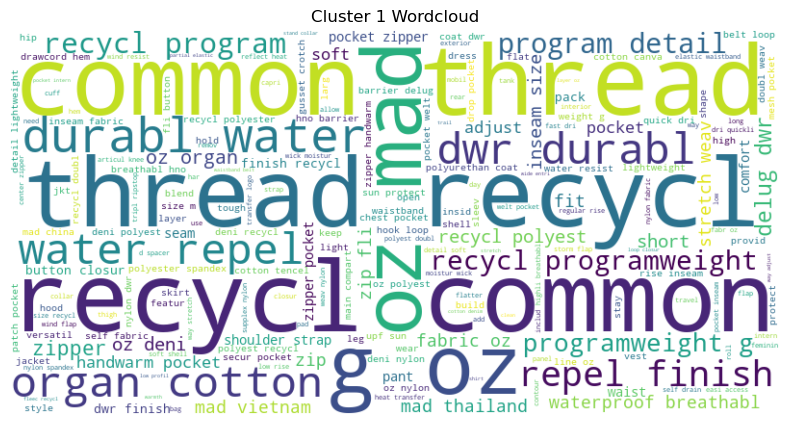

In [11]:
# Part 1: Clustering with DBSCAN and show the Recyclable common threads
dbscan = DBSCAN(eps=0.7, min_samples=5, metric='cosine')
df['cluster'] = dbscan.fit_predict(tfidf_matrix)

# Display wordclouds for each cluster
clusters = df['cluster'].unique()
print(len(clusters))
print(df['cluster'].value_counts())
for cluster_id in clusters:
    if cluster_id ==1:
        cluster_text = ' '.join(df[df['cluster'] == cluster_id]['cleaned_description'])
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cluster_text)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Cluster {cluster_id} Wordcloud')
        plt.axis('off')
        plt.show()



I notice also that in the first 5 words of the description you get the type of the product ( boxer pants shirt jersey ect ..), and the rest describe the material the sepcity the usage ect ...  So i suggest to do 2 clustering one on the fifht first word to cluster similar type of product, and a second one to catch the specificty of the product and then combine the results.

In [12]:
## remove Recycle Common Threads


nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
ps = PorterStemmer()
df = pd.read_csv('sample-data.csv')
# Preprocess the textual data

def get_most_common_words(text):
    text = text.split()
    word_counts = Counter(text)
    # Get the most common words
    most_common_words = word_counts.most_common(5)

def get_first_words(text):
    doc = nlp(text)
    return doc[0:6]    
    return most_common_words

def preprocess_text(text):
    
    text = str(fromstring(text).text_content())
    text = text.replace("Recyclable through the Common Threads", "")
    text = text.replace("Recycling Program", "")
    text = text.replace("oz", "")
    text = re.sub(r"[!\"#$%&()*+,-./:;<=>?@[\\\]^_`{|}~]+", "",text )
    text = re.sub("\d+", "", text)
    text = re.sub(r"\s+", " ", text)
    text = text.lower()
    doc = nlp(text)
    tokens = [token.lemma_ for token in doc if not token.is_stop]
    tokens = [ps.stem(word) for word in tokens]
    return ' '.join(tokens)


df['cleaned_description'] = df['description'].apply(preprocess_text)
df['most_common_words'] = df['cleaned_description'].apply(get_most_common_words)
df['5_first_word'] = df['cleaned_description'].apply(get_first_words)


# TF-IDF transformation
tfidf_vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(df['cleaned_description'])
df[['most_common_words','5_first_word']].to_csv("sample-process.csv")
df

,id,description,cleaned_description,most_common_words,5_first_word
0,1,Active classic boxers - There's a reason why o...,activ classic boxer reason boxer cult favorit ...,None,"(activ, classic, boxer, reason, boxer, cult)"
1,2,Active sport boxer briefs - Skinning up Glory ...,activ sport boxer brief skin glori requir move...,None,"(activ, sport, boxer, brief, skin, glori)"
2,3,Active sport briefs - These superbreathable no...,activ sport brief superbreath nofli brief mini...,None,"(activ, sport, brief, superbreath, nofli, brief)"
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpin guid pant skin climb ice switch rock tra...,None,"(alpin, guid, pant, skin, climb, ice)"
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpin wind jkt high ridg steep ice alpin jacke...,None,"(alpin, wind, jkt, high, ridg, steep)"
...,...,...,...,...,...
495,496,Cap 2 bottoms - Cut loose from the maddening c...,cap bottom cut loos madden crowd search undon ...,None,"(cap, bottom, cut, loos, madden, crowd)"
496,497,Cap 2 crew - This crew takes the edge off fick...,cap crew crew take edg fickl weather clear con...,None,"(cap, crew, crew, take, edg, fickl)"
497,498,All-time shell - No need to use that morning T...,alltim shell need use morn time umbrella allti...,None,"(alltim, shell, need, use, morn, time)"
498,499,All-wear cargo shorts - All-Wear Cargo Shorts ...,allwear cargo short allwear cargo short bask g...,None,"(allwear, cargo, short, allwear, cargo, short)"


In [13]:
df['5_first_word']

0          (activ, classic, boxer, reason, boxer, cult)
1             (activ, sport, boxer, brief, skin, glori)
2      (activ, sport, brief, superbreath, nofli, brief)
3                 (alpin, guid, pant, skin, climb, ice)
4                 (alpin, wind, jkt, high, ridg, steep)
                             ...                       
495             (cap, bottom, cut, loos, madden, crowd)
496                 (cap, crew, crew, take, edg, fickl)
497              (alltim, shell, need, use, morn, time)
498      (allwear, cargo, short, allwear, cargo, short)
499    (allwear, short, time, simplifi, allwear, short)
Name: 5_first_word, Length: 500, dtype: object

17
 1     142
-1     120
 4      55
 0      49
 8      24
 2      22
 6      18
 12     11
 3       9
 13      8
 5       8
 10      8
 11      7
 7       6
 9       5
 14      4
 15      4
Name: cluster, dtype: int64


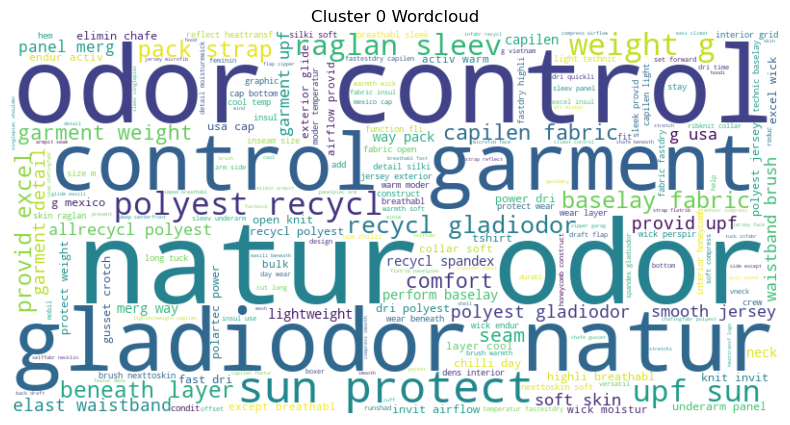

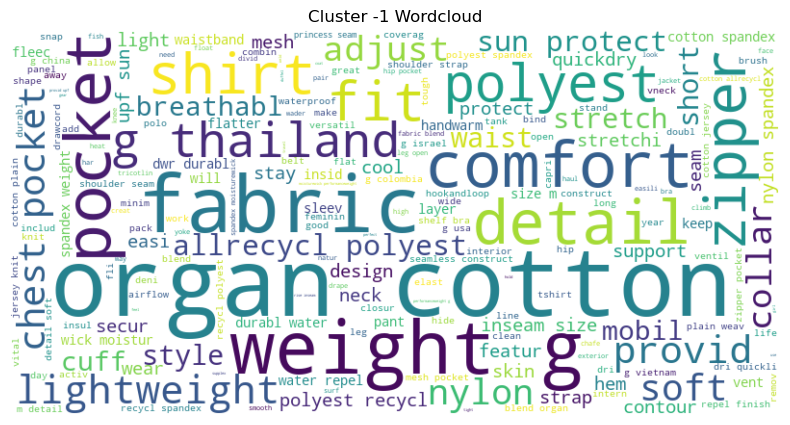

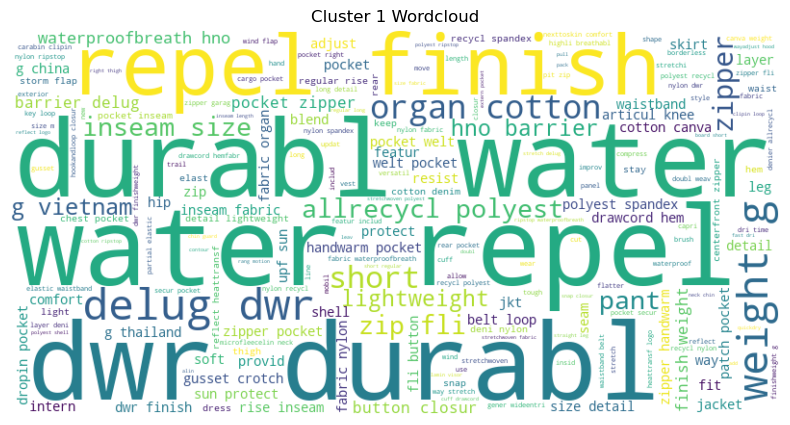

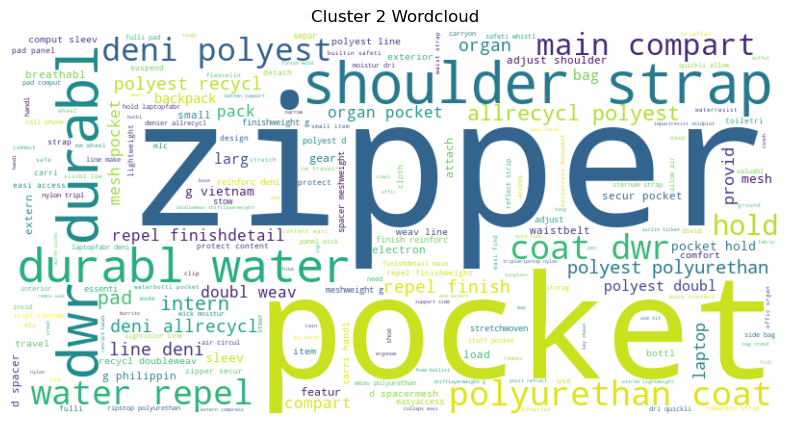

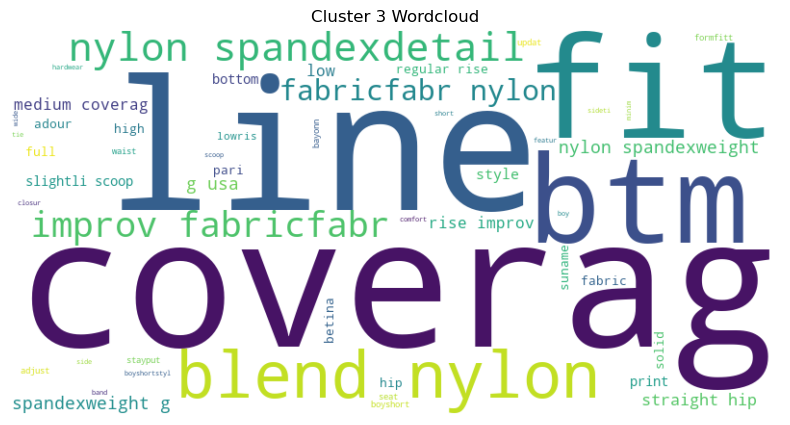

...

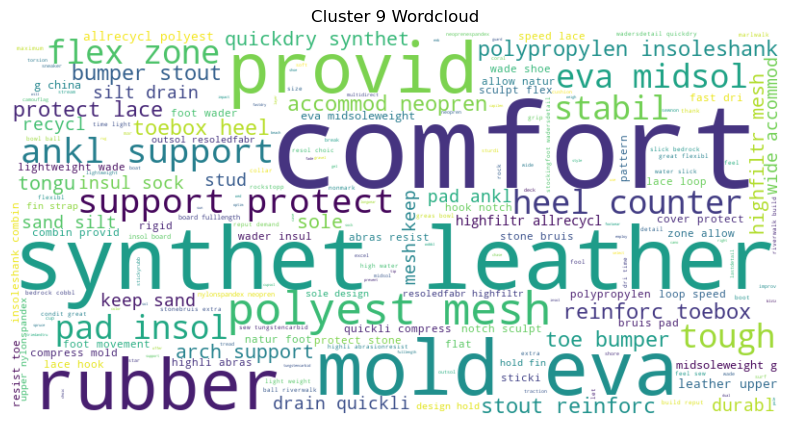

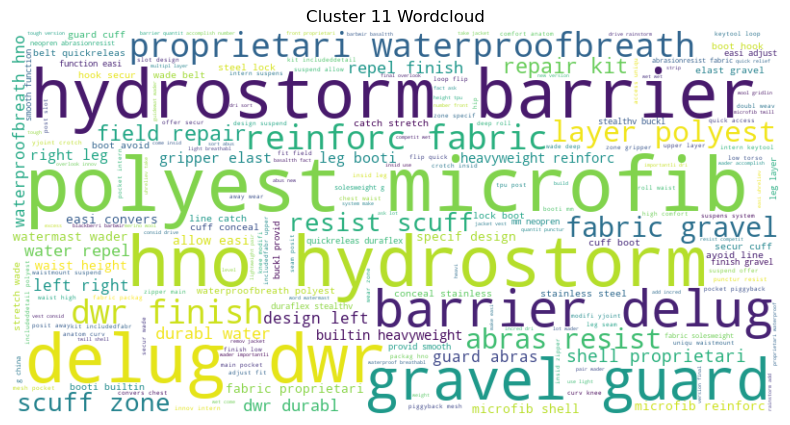

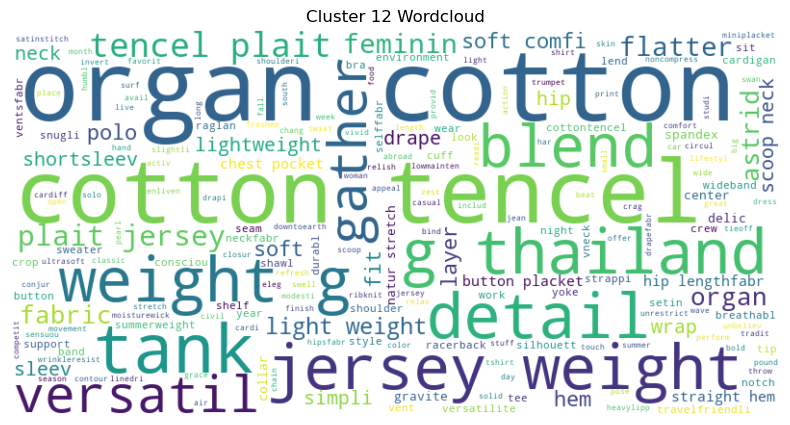

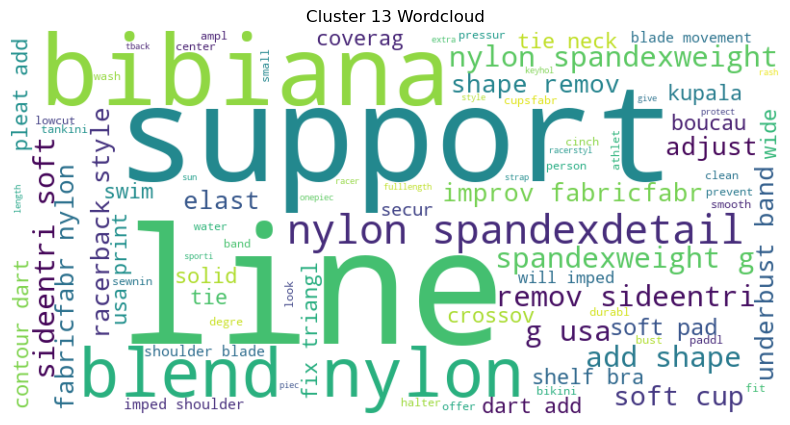

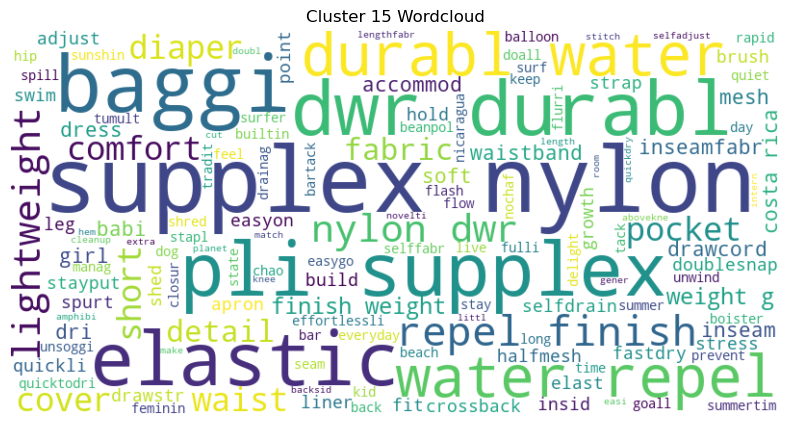

In [14]:
# Part 1.2: multi Clustering with DBSCAN
dbscan = DBSCAN(eps=0.7, min_samples=5, metric='cosine')
df['cluster'] = dbscan.fit_predict(tfidf_matrix)

# Display wordclouds for each cluster
clusters = df['cluster'].unique()
print(len(clusters))
print(df['cluster'].value_counts())
for cluster_id in clusters:
    cluster_text = ' '.join(df[df['cluster'] == cluster_id]['cleaned_description'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cluster_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Cluster {cluster_id} Wordcloud')
    plt.axis('off')
    plt.show()

In [15]:
df['most_common_words'] = df['cleaned_description'].apply(get_most_common_words)
df['5_first_word'] = df['cleaned_description'].apply(get_first_words)

In [17]:
# Part 2: Recommender System
def find_similar_items(item_id, df, similarity_matrix):
    item_cluster = df[df['id'] == item_id]['cluster'].values[0]
    cluster_items = df[df['cluster'] == item_cluster]['id'].tolist()
    item_index = df[df['id'] == item_id].index[0]
    similarities = similarity_matrix[item_index]
    # Filter only items from the same cluster
    cluster_similarities = np.array([similarity for i, similarity in enumerate(similarities) if df.iloc[i]['id'] in cluster_items])
    similar_items = [df.iloc[cluster_items[i]]['id'] for i in cluster_similarities.argsort()[::-1][1:6]]
    return similar_items

# Create a similarity matrix
similarity_matrix = cosine_similarity(tfidf_matrix)

# User input for product ID
user_input = input("Enter the product ID you are interested in: ")
similar_items = find_similar_items(int(user_input), df, similarity_matrix)
print(f"\nProducts similar to {user_input}: {similar_items}")



Enter the product ID you are interested in:  2



Products similar to 2: [2, 20, 495, 19, 174]


In [18]:
df[df['id'].isin([2, 20, 495, 19, 174])]

,id,description,cleaned_description,most_common_words,5_first_word,cluster
1,2,Active sport boxer briefs - Skinning up Glory ...,activ sport boxer brief skin glori requir move...,None,"(activ, sport, boxer, brief, skin, glori)",0
18,19,"Cap 1 boxer briefs - On bivy or belay, the for...",cap boxer brief bivi belay formfitt capilen bo...,None,"(cap, boxer, brief, bivi, belay, formfitt)",0
19,20,Cap 1 graphic t-shirt - This tee is made from ...,cap graphic tshirt tee lightestweight capilen ...,None,"(cap, graphic, tshirt, tee, lightestweight, ca...",0
173,174,Cap 2 v-neck - The climber's choice: Capilene ...,cap vneck climber choic capilen fabric manag m...,None,"(cap, vneck, climber, choic, capilen, fabric)",0
494,495,"Active briefs - These featherweight, quick-wic...",activ brief featherweight quickwick brief comf...,None,"(activ, brief, featherweight, quickwick, brief...",0


      Topic_1   Topic_2   Topic_3   Topic_4   Topic_5   Topic_6   Topic_7  \
0    0.218527 -0.034361  0.150717  0.116651 -0.122952  0.003706 -0.070941   
1    0.208611 -0.047350  0.085524  0.112050 -0.064894 -0.076750 -0.014154   
2    0.189205 -0.058758  0.102201  0.045480 -0.052057 -0.055568  0.075977   
3    0.371326 -0.210769 -0.095698 -0.135636  0.017016 -0.022113 -0.121490   
4    0.398066 -0.215160 -0.004750 -0.248365 -0.020086  0.037963 -0.001140   
..        ...       ...       ...       ...       ...       ...       ...   
495  0.323544 -0.062657  0.365700  0.105523 -0.270831  0.066369 -0.174260   
496  0.324966 -0.051128  0.483588  0.031290 -0.290597  0.107791 -0.044407   
497  0.299424 -0.185102 -0.023714 -0.268308  0.031555  0.177515 -0.086309   
498  0.262501  0.083688 -0.193768  0.317039  0.043259  0.130287 -0.092275   
499  0.298994  0.073255 -0.244738  0.316096  0.048226  0.127848 -0.091291   

      Topic_8   Topic_9  Topic_10  
0   -0.020086 -0.148367 -0.013425  
1  

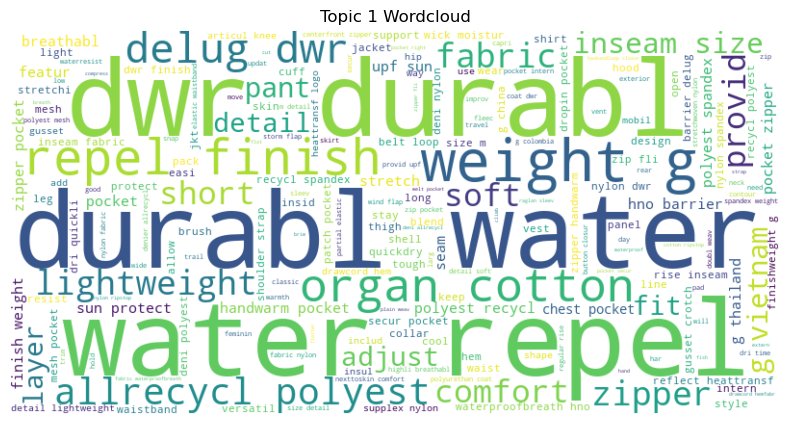

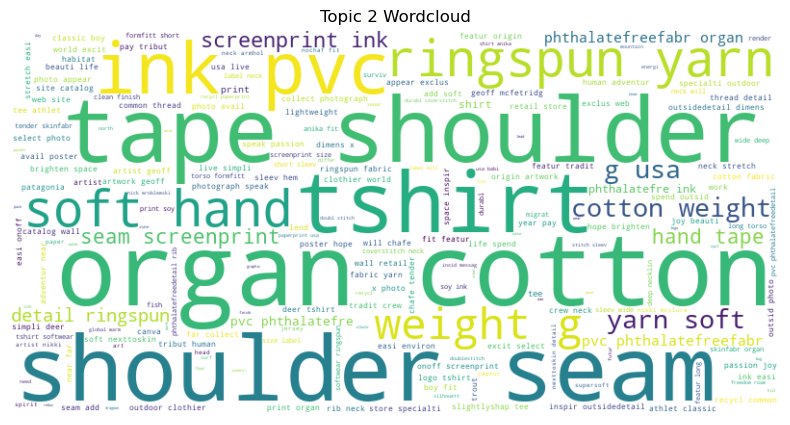

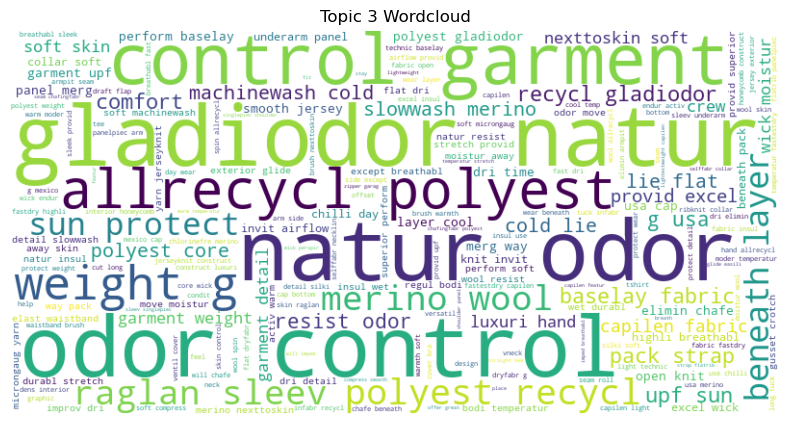

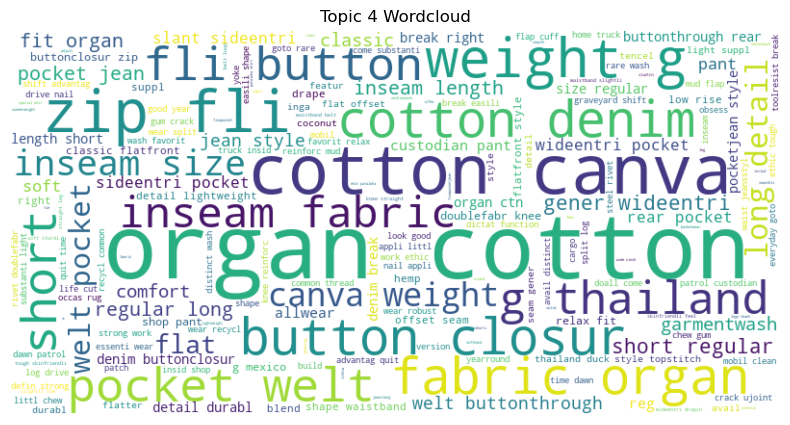

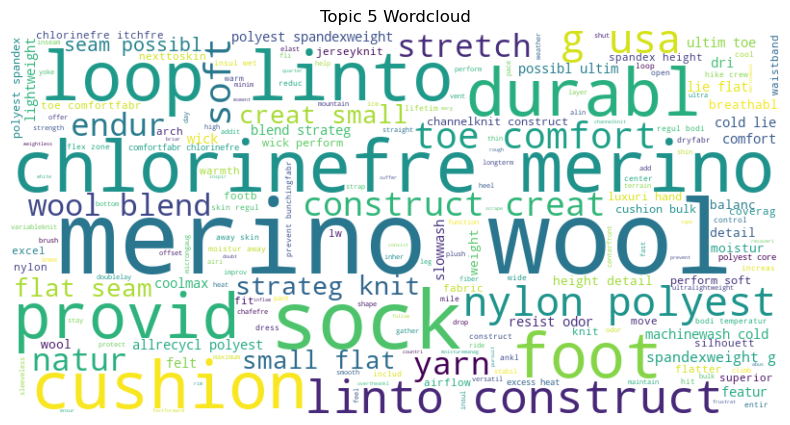

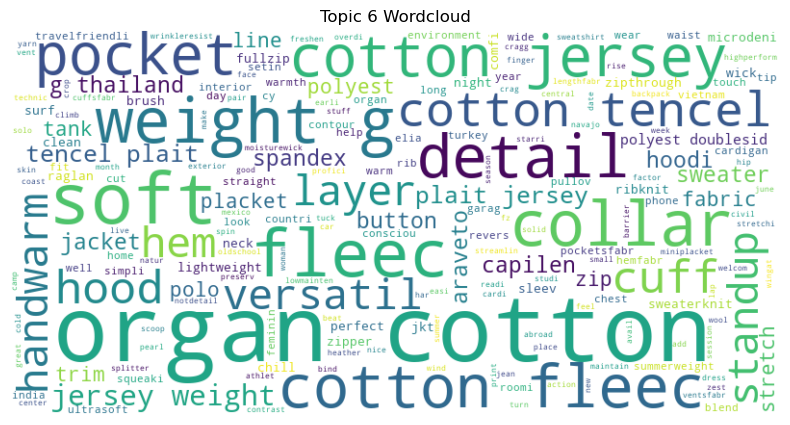

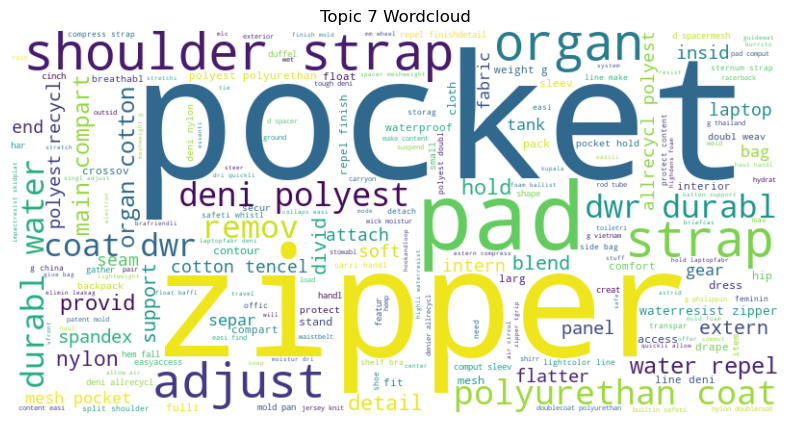

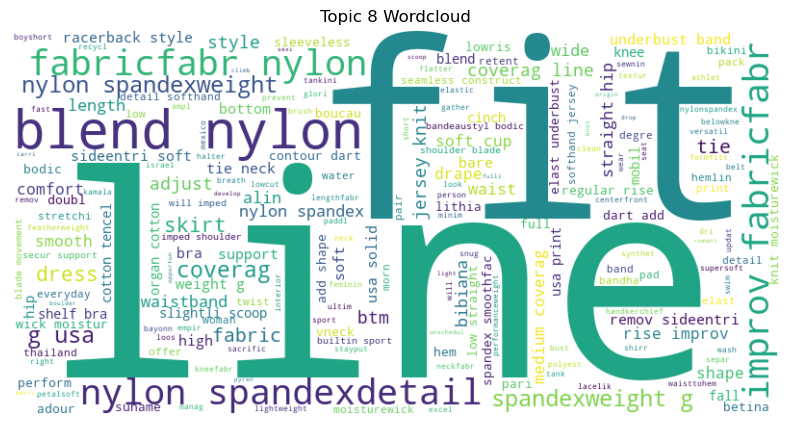

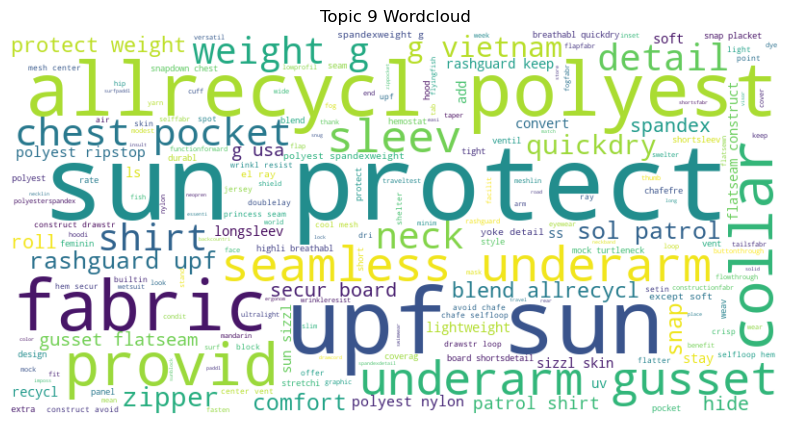

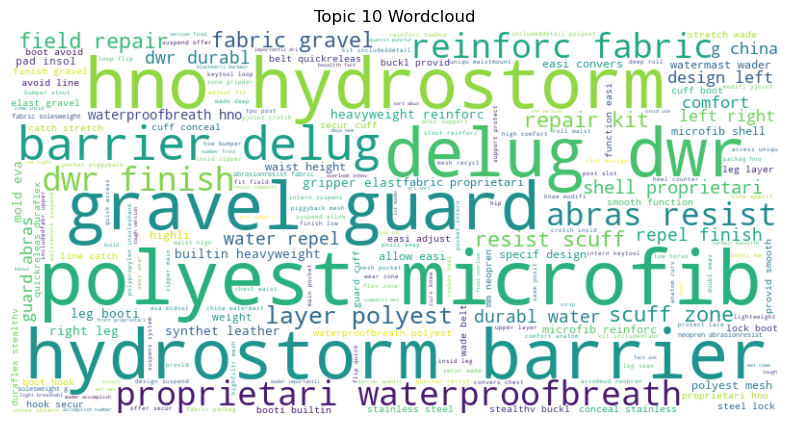

In [21]:
# Part 3: Topic Modeling with TruncatedSVD
n_components = 10
lsa_model = TruncatedSVD(n_components=n_components)
topic_encoded_matrix = lsa_model.fit_transform(tfidf_matrix)
topic_encoded_df = pd.DataFrame(topic_encoded_matrix, columns=[f'Topic_{i}' for i in range(1, n_components + 1)])
print(topic_encoded_df) 
# Display wordclouds for each topic
for i in range(n_components):
    topic_text = ' '.join(df.iloc[:, 2][topic_encoded_df.idxmax(axis=1) == f'Topic_{i + 1}'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(topic_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {i + 1} Wordcloud')
    plt.axis('off')
    plt.show()